Processes an example of our cine MRI dataset.

Several assumptions are made regarding the acquisition protocol.

- Cartesian cine dataset.
- GRAPPA acceleration expected.
- Phase Partial Fourier allowed.

This data is collected using cardiac triggering, which means that there are different numbers time points for each of the lines of k-space

Takes in raw k-space data (from .dat file)
Fills k-space using GRAPPA 
Completes partial Fourier recon
Resizes so all images are the same shape (in x and y)

Then we take this 'truth' data, and perform synthetic undersampling (gridded using a radial trajectory)
To form multi-coil, complex 2D+t paired training data for deep de-aliasing 

In this tutorial the dat file has been read and the data stored as h5 array, but the code to read dat files is commented out

In [1]:

import dataclasses
import functools
import pathlib

import h5py
import numpy as np
import tensorflow as tf
import tensorflow_mri as tfmri

import matplotlib.pyplot as plt
import matplotlib.animation

import operator

# This is necessary if reading from .dat files
from tensorflow_mri.python.io import twix_io

2025-01-21 22:41:32.166912: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-21 22:41:32.282165: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-21 22:41:32.308835: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# We need to read the raw data from the scanner (In siemens this is stored as a .dat file)

In this tutorial I have run this on a .dat file and saved the output in a h5 file to ensure confidentiality

In [2]:
#This cell contains functions that are only necessary if you are reading .dat files

def _get_loop_counters_as_tuple(header, dimensions=None, ignore_segments=True):
  if ignore_segments:
    header.loop_counters.seg = 0

  if dimensions is not None:
    # If a list of dimensions was specified, get only the requested dimensions,
    # after checking that none of the ignored dimensions are non-zero.
    for name, value in dataclasses.asdict(header.loop_counters).items():
      if value != 0 and name not in dimensions:
        raise ValueError(
            f"Unexpected non-zero value for loop counter `{name}`: "
            f"{header.loop_counters}")
    return operator.attrgetter(*dimensions)(header.loop_counters)

  # Return all loop counters (reversed).
  return tuple(reversed(dataclasses.astuple(header.loop_counters)))

def _get_kspace_shape(meas, dimensions=None, ignore_segments=True):
  first_header = None
  kspace_shape = _get_loop_counters_as_tuple(
      meas.scans[0].header, dimensions=dimensions,
      ignore_segments=ignore_segments)

  for scan in meas.scans[1:]:
    if scan.header.eval_info_mask.ACQEND:
      break
    if _should_skip_scan(scan.header):
      continue
    if first_header is None:
      first_header = scan.header

    kspace_shape = np.maximum(
        kspace_shape, _get_loop_counters_as_tuple(
            scan.header, dimensions=dimensions,
            ignore_segments=ignore_segments))

  kspace_shape += 1
  kspace_shape = tuple(kspace_shape)
  kspace_shape += (first_header.used_channels, first_header.samples_in_scan)
  return kspace_shape

def _should_skip_scan(header):
  # Skip scans with these flags.
  skip_flags = ['SYNCDATA', 'RETRO_DUMMYSCAN', 'NOISEADJSCAN']
  return any(getattr(header.eval_info_mask, flag) for flag in skip_flags)

def _dataclass_diff_summary(a, b):
  # Check that object is a dataclass instance.
  # https://docs.python.org/3/library/dataclasses.html#dataclasses.is_dataclass
  if not dataclasses.is_dataclass(a) or isinstance(a, type):
    raise TypeError(f"Input must be a dataclass instance, but got: {a}")

  if a.__class__ != b.__class__:
    raise TypeError(
        f"Classes must have the same type: {a.__class__} != {b.__class__}")

  # Find differences.
  # diff = {}
  summary = []
  for field in dataclasses.fields(a):
    value_a = getattr(a, field.name)
    value_b = getattr(b, field.name)
    if value_a != value_b:
      if dataclasses.is_dataclass(field.type):
        # Recurse.
        temp = _dataclass_diff_summary(value_a, value_b)
        # Indent.
        temp = '\n'.join(map(lambda x: '  ' + x, temp.splitlines()))
        summary.append(f"{field.name}:\n{temp}")
      else:
        summary.append(f"{field.name}: {value_a} != {value_b}")

  # Create string.
  return '\n'.join(summary)

def get_kspace_array_from_twix_measurement(meas,
                                           output_dimensions=None,
                                           ignore_segments=True,
                                           create_mask=False,
                                           keep_scan_fn=None):

  kspace_shape = _get_kspace_shape(meas, dimensions=output_dimensions,
                                   ignore_segments=ignore_segments)
  kspace = np.zeros(kspace_shape, dtype=np.complex64)
  if create_mask:
    mask = np.zeros(kspace_shape[:-2], dtype=np.bool_)

  # We use this to keep track of what indices we've already filled.
  accu_counters = {}

  # Scans with one of these flags will be ignored.
  for scan in meas.scans:
    if scan.header.eval_info_mask.ACQEND:
      break
    if _should_skip_scan(scan.header):
      continue
    if keep_scan_fn is not None and not keep_scan_fn(scan.header):
      continue

    counters = _get_loop_counters_as_tuple(
          scan.header, dimensions=output_dimensions,
          ignore_segments=ignore_segments)

    if counters in accu_counters:
      raise ValueError(
          f"Duplicate index counters: {counters}. Do you need another dimension?\n\n"
          f"Current scan header:\n{scan.header}\n\n"
          f"Previous scan header:\n{accu_counters[counters]}\n\n"
          f"Diff (current, previous):\n{_dataclass_diff_summary(scan.header, accu_counters[counters])}")
    accu_counters[counters] = scan.header

    for channel_idx, channel in enumerate(scan.channels):
      kspace[counters + (channel_idx,)] = channel.data.numpy()
      if create_mask:
        mask[counters] = True

  if create_mask:
    return kspace, mask
  return kspace

def read_raw_data_file(input_file):
    # Read TWIX file.
    contents = tf.io.read_file(str(input_file))
    twix = tfmri.io.parse_twix(contents)

    meas = twix.measurements[-1]
    meas_prot = meas.protocol['Meas']

    PARTIAL_FOURIER_FACTOR = {
        0x01: 0.5,
        0x02: 5.0 / 8.0,
        0x04: 6.0 / 8.0,
        0x08: 7.0 / 8.0,
        0x10: 1.0
    }
    # The following are actually used in the computation.
    phase_pf = PARTIAL_FOURIER_FACTOR[meas_prot.MEAS.sKSpace.ucPhasePartialFourier.value]

    for scan in meas.scans:
        if _should_skip_scan(scan.header):
            continue
        kspace_centre_line = scan.header.kspace_centre_line_no
        break

    # Loop k-space data.
    OUTPUT_DIMENSIONS = ['slice', 'phase', 'line']
    kspace, kspace_mask = get_kspace_array_from_twix_measurement(
        meas, output_dimensions=OUTPUT_DIMENSIONS,
        ignore_segments=True, create_mask=True)
    # kspace: [slices, phases, lines, coils, columns]
    # kspace_mask: [slices, phases, lines]

    # Loop calibration data.
    def keep_scan_fn(header):
        flags = header.eval_info_mask
        return (flags.PATREFSCAN or flags.PATREFANDIMASCAN)
    calib, calib_mask = get_kspace_array_from_twix_measurement(
        meas, output_dimensions=OUTPUT_DIMENSIONS,
        ignore_segments=True, create_mask=True,
        keep_scan_fn=keep_scan_fn)
    # calib: [slices, phases, lines, coils, columns]
    # calib_mask: [slices, phases, lines]    


    return phase_pf, kspace_centre_line, kspace, kspace_mask, calib, calib_mask

The below cell is only needed if you are reading from a .dat file
In this tutorial the .dat file has been read using these functions and the necessary outputs have been stored in a h5 file

In [3]:
#This cell is only needed if reading from a .dat file

# input_file =pathlib.Path('/workspaces/Tutorials/DataFile.dat')
# input_file = pathlib.Path(input_file)
# phase_pf, kspace_centre_line, kspace, kspace_mask, calib, calib_mask = read_raw_data_file(input_file)  

# # write these results to h5 for the purposes of the tutorial
# f = h5py.File('/workspaces/Tutorials/exampleRawDataCine.hdf5', 'w')
# f.create_dataset('phase_pf', data = phase_pf)
# f.create_dataset('kspace_centre_line', data = kspace_centre_line)
# f.create_dataset('kspace', data = kspace)
# f.create_dataset('kspace_mask', data = kspace_mask)
# f.create_dataset('calib', data = calib)
# f.create_dataset('calib_mask', data = calib_mask)

In [4]:
# Use this cell if reading from the pre-processed h5 file

import gdown

url = 'https://drive.google.com/uc?id=1GAM91x54VsKmepImKkza0Lh_kUjQ-oOj'
output = '/tools/docs/tutorials/recon/exampleRawDataCine.hdf5.zip'
gdown.download(url, output, quiet=False)

import zipfile
with zipfile.ZipFile("/tools/docs/tutorials/recon/exampleRawDataCine.hdf5.zip","r") as zip_ref:
    zip_ref.extractall("/tools/docs/tutorials/recon/")

input_file =pathlib.Path('/tools/docs/tutorials/recon/exampleRawDataCine.hdf5')

input_file = pathlib.Path(input_file)
f = h5py.File(input_file, 'r')
list(f.keys())

phase_pf            = f['phase_pf'][()]             # This is the parial fourier factor in the phase direction
kspace_centre_line  = f['kspace_centre_line'][()]   # This is the line index which represents the centre of kspace
kspace              = f['kspace']                   # This is the kspace data fourier factor in the phase direction in the format # [slices, cardiac_phases, y, coils, x]
kspace_mask         = f['kspace_mask']              # This is a 1's and 0's mask which determines which lines of k-space were acquired
calib               = f['calib']                    # This is the calibration (ACS) lines from the GRAPPA acquisition
calib_mask          = f['calib_mask']               # This is a 1's and 0's mask which determines which lines of k-space the ACS lines represent


In [5]:
kspace.shape
# [slices, cardiac_phases, y, coils, x]
# (1, 45, 190, 30, 544)

(1, 45, 190, 30, 544)

The cine data which we often use for training is from a 
Cartesian bSSFP sequence
It has GRAPPA x2, with 24 ACS lines
And partial fourier in the phase direction of ~75%

The data is acquired in a breath-hold, and is segmented
This means that the data is collected over a number of RR intervals, where a different set of lines of k=space are collected in each R-wave

However variations in heart-rate mean that some R-waves are longer than others, and when combining the line data together for form multiple cardiac phases, there are lines which have more cardiac phases than others

In [6]:
# This functions is necessary to deal with the varying number of cardiac_phases for each line of kspace

def _fill_missing_lines_in_last_phases(kspace, mask, threshold):
  # The last few phases may have some empty lines. If the proportion of missing
  # lines is more than `threshold`, just drop the entire phase. Otherwise, fill
  # the missing lines with data from the previous phase.
  expected_lines = np.count_nonzero(mask[0, 0])
  expected_lines_mask = mask[0, 0]
  # Count number of acquired lines for each slice and phase.
  acquired_lines = np.count_nonzero(mask, axis=-1)
  # Find which phases are to be kept (1D boolean array, true if phase has
  # enough lines).
  phases_to_keep = np.all(
      acquired_lines >= expected_lines * (1.0 - threshold), axis=0)
  # Find the number of phases as the first False entry in the phases_to_keep
  # array.
  phases_to_discard_indices = np.nonzero(~phases_to_keep)[0]
  if len(phases_to_discard_indices) == 0:
    # There are no incomplete phases.
    first_discarded_phase = None
    num_phases = len(phases_to_keep)
  else:
    first_discarded_phase = phases_to_discard_indices[0]
    num_phases = first_discarded_phase
  kspace = kspace[:, :num_phases, ...]
  mask = mask[:, :num_phases, ...]
  # Now fill the missing lines with data from the previous phase.
  for slice_index, phase_index in np.ndindex(mask.shape[:2]):
    # Lines mask for this slice and phase.
    lines_mask = mask[slice_index, phase_index]

    # Fill missing lines with data from the previous phase.
    missing_lines_mask = np.logical_and(
        expected_lines_mask, np.logical_not(lines_mask))
    mask[slice_index, phase_index][missing_lines_mask] = True
    kspace[slice_index, phase_index][missing_lines_mask] = \
        kspace[slice_index, phase_index - 1][missing_lines_mask]

  return kspace, mask


In [7]:
THRESHOLD_MISSING_LINES_KSPACE = 0.3
THRESHOLD_MISSING_LINES_CALIB = 0.1
 
# Fill in missing lines.
kspace, kspace_mask = _fill_missing_lines_in_last_phases(
    kspace, kspace_mask, threshold=THRESHOLD_MISSING_LINES_KSPACE)

calib, calib_mask = _fill_missing_lines_in_last_phases(
    calib, calib_mask, threshold=THRESHOLD_MISSING_LINES_CALIB)

# Keep the lowest number of phases between `kspace` and `calib`.
phases = np.minimum(kspace.shape[1], calib.shape[1]) 
kspace = kspace[:, :phases, ...]
kspace_mask = kspace_mask[:, :phases, ...]
calib = calib[:, :phases, ...]
calib_mask = calib_mask[:, :phases, ...]
max_line = kspace_mask.shape[-1]

if phase_pf == 1.0:
  pe_lines = max_line
  assert kspace_centre_line == (max_line + 1) // 2
else:
  pe_lines = kspace_centre_line * 2  # Assuming even number of lines.
  phase_pf = max_line / pe_lines

  phase_pf = float(phase_pf)

The raw data is collected with both GRAPPA and PArtial Fourer acquistion. 
To use this data as our 'truth' we want to have fully sampled data.
Therefore we need to perform both GRAPPA and partial fourier reconstruction to fill in the missing lines of k-space

In [8]:
# This cell contains all of the functionality to convert the k-space (with PF and GRAPPA) to a fully sampled dataset 

def _reconstruct_slice(kspace, kspace_mask, calib, calib_mask, phase_pf=1.0):

  # Create masked kspace and calib.
  kspace_lines_mask = kspace_mask[0]
  masked_kspace = kspace[:, kspace_lines_mask]
  calib_lines_mask = calib_mask[0]
  masked_calib = calib[:, calib_lines_mask]

  # Transpose.
  masked_kspace = np.transpose(masked_kspace, (0, 2, 1, 3))  # [phases, coils, lines, columns]
  masked_calib = np.transpose(masked_calib, (0, 2, 1, 3))  # [phases, coils, lines, columns]

  # Finally, make 2D mask (lines, columns).
  mask = np.transpose(np.tile(kspace_mask[0, ...], (masked_kspace.shape[-1], 1)))

  # Although tfmri.recon.grappa supports batches, it is quite likely to run out
  # of memory. Therefore we perform GRAPPA one phase at a time.
  num_coils = masked_kspace.shape[-3]
  def _single_phase_grappa(inputs):
    single_phase_kspace, single_phase_calib = inputs

    #print('single_phase_kspace: ', single_phase_kspace.shape, ' , mask:', mask.shape, ' , single_phase_calib: ',single_phase_calib.shape)
    #print('single_phase_kspace: ', single_phase_kspace.dtype, ' , mask:', mask.dtype, ' , single_phase_calib: ',single_phase_calib.dtype)
    # 
    # single_phase_kspace:  (30, 117, 544)  , mask: (190, 544)  , single_phase_calib:  (30, 44, 544)
    # single_phase_kspace:  <dtype: 'complex64'>  , mask: bool  , single_phase_calib:  <dtype: 'complex64'>

    return tfmri.recon.grappa(single_phase_kspace, mask, single_phase_calib,
                              return_kspace=True)
  kspace = tf.map_fn(_single_phase_grappa, [masked_kspace, masked_calib],
                     fn_output_signature=tf.TensorSpec(
                         shape=tf.TensorShape([num_coils]).concatenate(mask.shape),
                         dtype=tf.complex64))

  if phase_pf != 1.0:
    # kspace = tf.pad(kspace, [[0, 0], [0, 0], [0, 44], [0, 0]])
    def _single_phase_pf(inputs):
      return tfmri.recon.partial_fourier(
          inputs, [phase_pf, 1.0], method='homodyne',
          preserve_phase=True, return_kspace=True)

    _single_phase_pf(kspace)
    kspace = tf.map_fn(_single_phase_pf, kspace)

  return kspace

Here we call the function that performs the GRAPPA and PF recon for our dataset

In [9]:
# Reconstruct all slices and phases.
fully_sampled_kspace = np.vectorize(functools.partial(_reconstruct_slice,
                                        phase_pf=phase_pf),
                      otypes=['complex64'],
                      signature='(phs, lin, cha, col),(phs, lin),(phs, lin, cha, col),(phs, lin)->(phs, cha, out_lin, col)')(
    kspace, kspace_mask, calib, calib_mask)

print('Resulting fully-sampled fully_sampled_kspace.shape:', fully_sampled_kspace.shape)

# and now save fully_sampled_kspace as fully sampled dataset which can be used for training
# output_file = input_file.with_suffix('.h5')


2025-01-21 22:41:41.705654: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-21 22:41:42.621475: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 436 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:65:00.0, compute capability: 8.6
2025-01-21 22:41:42.622945: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 21746 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:b3:00.0, compute capability: 8.6
2025-01-21 22:41:52.943571: W tensorflow/core/common_runtime/bfc_allocator.cc:479] Allocator (GPU_0_bfc) ran out o

ResourceExhaustedError: {{function_node __wrapped__Less_device_/job:localhost/replica:0/task:0/device:GPU:0}} SameWorkerRecvDone unable to allocate output tensor. Key: /job:localhost/replica:0/task:0/device:GPU:0;43649fa394554138;/job:localhost/replica:0/task:0/device:GPU:0;edge_4_Less;0:0
	 [[{{node Less/_6}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:Less]

Now we have our fully sampled k-space, however each subjust mau have a different size image/kspace 
So we reize (crop or pad) the data so that all trainig data sets are the same size

In [ ]:
# In training we often want to make all the data the same size

new_base_resolution = 256
image_shape = tf.constant([new_base_resolution, new_base_resolution], dtype=tf.int32)

fully_sampled_kspace = tf.cast(np.squeeze(fully_sampled_kspace), dtype = tf.complex64)
    
# Crop to fixed image size.
ground_truth_image = tfmri.signal.ifft(fully_sampled_kspace, axes=[-2, -1], shift=True)
ground_truth_image = tfmri.resize_with_crop_or_pad(ground_truth_image, image_shape)

# This is the FINAL 'truth; image
# complex multicoil image data
print(ground_truth_image.shape)
#(21, 30, 256, 256)

# Get number of phases in this image.
num_phases = ground_truth_image.shape[0]

(21, 30, 256, 256)


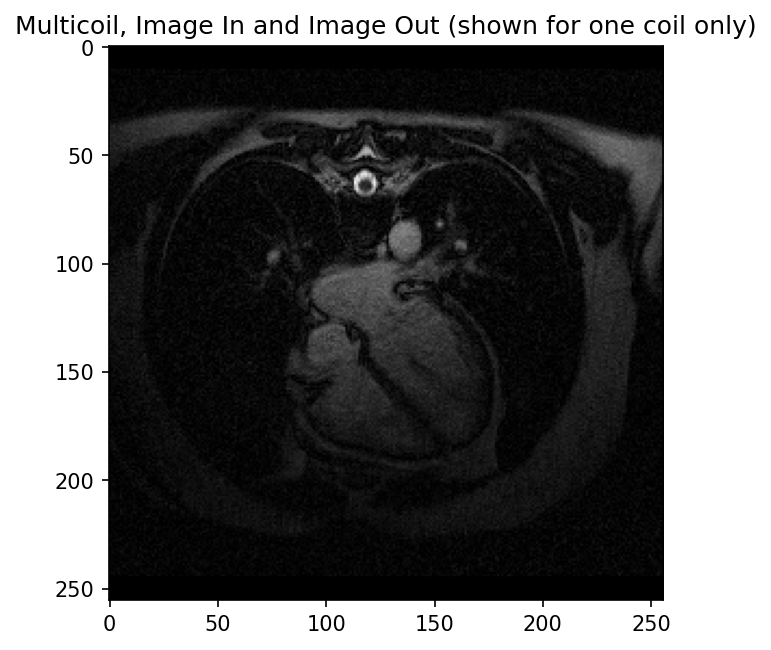

In [ ]:
# And lets visualise
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots()

cCoil = 0
t= np.linspace(0,num_phases)
def animate(t):
    plt.imshow(np.squeeze(tf.math.abs(ground_truth_image[t,cCoil,:,:])), cmap = 'gray')
    plt.title('Ground truth images (shown for one coil only)')

matplotlib.animation.FuncAnimation(fig, animate, frames=num_phases)


At this point we have the ground truth k-space and image data

However, often we want to create paired undersampled data when performing ML.

In this example we will create radially undersampled cine data (multi-coil, complex)
Here we use the parameters from the cmplex_multicoilUnet tutorial (radial)

In [ ]:
# There is more informtion about calculating trajectories and gridding in the nufftTutorial
radial_views = 13 
    
# Compute trajectory.
trajectory = tfmri.sampling.radial_trajectory(base_resolution=new_base_resolution,
                                                views=radial_views,
                                                phases=phases,
                                                ordering='sorted_half')
# Compute density.
density = tfmri.sampling.estimate_radial_density(trajectory)

# Flatten trajectory and density.
trajectory = tfmri.sampling.flatten_trajectory(trajectory)
density = tfmri.sampling.flatten_density(density)

Final_image = tf.einsum('...tchw->...cthw', ground_truth_image) #check dims

print(Final_image.shape)
print(trajectory.shape)
#(30, 21, 256, 256)
#(21, 6656, 2)

# Final_image should be [time, coil, x, y]] 
# traj should # [time, nPtsPerRadial*nRadials, 2]]

radial_kspace = tfmri.signal.nufft(Final_image, trajectory,
                              transform_type='type_2',
                              fft_direction='forward')
radial_kspace /= tf.math.sqrt(
      tf.cast(tf.math.reduce_prod(image_shape), tf.complex64))


(30, 21, 256, 256)
(21, 6656, 2)


Now we have created out undersampled multi-coil complex radial k-space data, we need to grid it to get the paired images for training

In [ ]:
# Now lets go back into image space
# Apply density compensation.
radial_kspace /= tf.cast(density, tf.complex64)

# and do 2D+t NUFFT to create the image from the undersampled radial kspace 
zfill_image = tfmri.signal.nufft(radial_kspace, trajectory,
                           grid_shape=image_shape, # Note that this is still [256, 256]
                           transform_type='type_1',
                           fft_direction='backward')

print('multicoil_time_recon.shape: ', zfill_image.shape)
# (12, 20, 256, 256)

def normalise(image):
    scale = tf.math.reduce_max(tf.math.abs(image))
    image = image / tf.cast(scale, image.dtype)
    return image
zfill_image = normalise(zfill_image)

# For use in training we will store as stacked real/imaginary data rather than as complex data
def convert_to_real(complex_tensor):
  # Get the real and imaginary parts
  real_part = tf.math.real(complex_tensor)
  imag_part = tf.math.imag(complex_tensor)

  stacked = tf.concat([real_part, imag_part], axis=0)
  return stacked

# This is only used here for visualisation, but if you were training a magnetide only UNet you would also need to combne the coil eleemnts like this
zfill_cc_for_vis = np.abs(tfmri.coils.combine_coils(zfill_image, coil_axis=-4))

# This is the format that the final image is taken in as for the UNet
zfill_image = convert_to_real(zfill_image)#USE FOR MULTICOIL

# The target imahe is often a coil-combined, magnitude image (even if the input is multi-coil, complex), so the following lines are necessary to create the final 'ground truth' input used by the model
target_coill_combined_image = tfmri.coils.combine_coils(Final_image, coil_axis=-4)
target_coill_combined_image = np.abs(normalise(target_coill_combined_image))

# Note that both the input and the ourput for the network are normalised between [0 - 1] before being used by the network

# And lets visualise
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots()

cCoil = 0
t= np.linspace(0,num_phases)
def animate2(t):
    plt.imshow(InputOutputPair[t,:,:], cmap = 'gray')
    plt.title(' Image In and Image Out (shown for one combined coils)')

InputOutputPair = np.concatenate([target_coill_combined_image, zfill_cc_for_vis], axis=1)
matplotlib.animation.FuncAnimation(fig, animate2, frames=num_phases)

multicoil_time_recon.shape:  (30, 21, 256, 256)


In [ ]:
print(image.shape)